# OPAL - OPAL-X comparison on Fields


In [1]:
import sys
sys.path.append('/psi/home/adelmann/git/pyOPALTools')
import numpy as np
from opal import load_dataset

import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import ipywidgets as widgets
from IPython.display import display
import re

## Set the plotting style

In [2]:
from opal.visualization.styles import load_style

load_style('jupyter')

## Setup helpers 

In [3]:
def visualize_integrated_scalar_field_3d_disc(file_path, title):
    # Read the data from the file
    df = pd.read_csv(file_path, delim_whitespace=True, comment='#', header=None, skiprows=3, names=['i', 'j', 'k', 'x', 'y', 'z', 'rho'])
    
    # Group by i and j, and integrate phi over k
    df_grouped = df.groupby(['i', 'j']).apply(lambda g: np.trapz(g['rho'], g['k']))
    df_grouped = df_grouped.reset_index(name='rho_integrated')
    
    # Extracting indices and integrated phi values
    i = df_grouped['i'].values
    j = df_grouped['j'].values
    phi_integrated = df_grouped['rho_integrated'].values
    
    print(len(i))
    print(len(phi_integrated))
        
    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(i, j, phi_integrated, c=phi_integrated, cmap='viridis', marker='o')
    
    # Adding color bar to indicate the scalar field values
    cbar = plt.colorbar(sc)
    cbar.set_label('Integrated quantity')
    
    # Set labels for the axes
    ax.set_xlabel('i')
    ax.set_ylabel('j')
    #ax.set_zlabel('Integrated quantity',labelpad=10)
    
    ax.set_title(title)
    x = sum(phi_integrated)
    fig.text(0.3, 0.3, fr'$\int_\Omega \rho d\Omega= {x}$', fontsize=12, va='center')


    
    plt.show()
    return 

In [4]:
def extract_origin_and_h(fn):
    
    with open(fn, 'r') as file:
        file.readline()  # Skip the first line
        header = file.readline().strip()
    
    # Define regular expressions to extract origin and h
        
    origin_pattern = r'origin=\s*\(\s*(-?\d+\.\d+)\s*,\s*(-?\d+\.\d+)\s*,\s*(-?\d+\.\d+)\s*\)'
    h_pattern = r'h=\s*\(\s*(-?\d+\.\d+)\s*,\s*(-?\d+\.\d+)\s*,\s*(-?\d+\.\d+)\s*\)'
    
    # Search for the patterns in the header
    origin_match = re.search(origin_pattern, header)
    h_match = re.search(h_pattern, header)
    
    if origin_match and h_match:
        origin = tuple(map(float, origin_match.groups()))
        h = tuple(map(float, h_match.groups()))
        
        return {
            'origin': origin,
            'h': h
        }
    else:
        raise ValueError("Header format is incorrect or missing required values")

# OPAL and OPALX data directories on Merlin

In [17]:
opaldir  = '/psi/home/adelmann/git/opal-src-4-opalx-debug/input-files/Drift-2/'
opalxdir = '/psi/home/adelmann/opalx/input-files/data/'

# OPAL fields

In [18]:
opalrho     = opaldir + 'Drift-2-rho_scalar-000000.dat'
opalrhs2    = opaldir + 'Drift-2-rhs2_scalar-000000.dat'
opalrhs2tr  = opaldir + 'Drift-3-rhs2tr_scalar-000000.dat'

opalsol2tr  = opaldir + 'Drift-2-sol2tr_scalar-000000.dat'
opalsol2    = opaldir + 'Drift-2-sol2_scalar-000000.dat'
opalsol     = opaldir + 'Drift-2-sol_scalar-000000.dat'

1024
1024


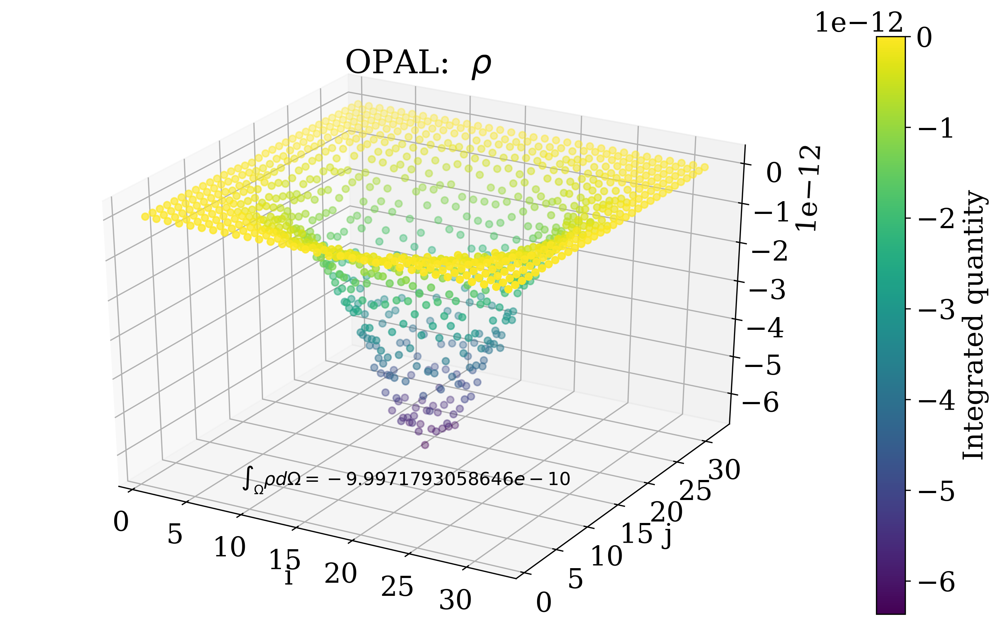

In [19]:
visualize_integrated_scalar_field_3d_disc(opalrho, r'OPAL:  $\rho$')

4096
4096


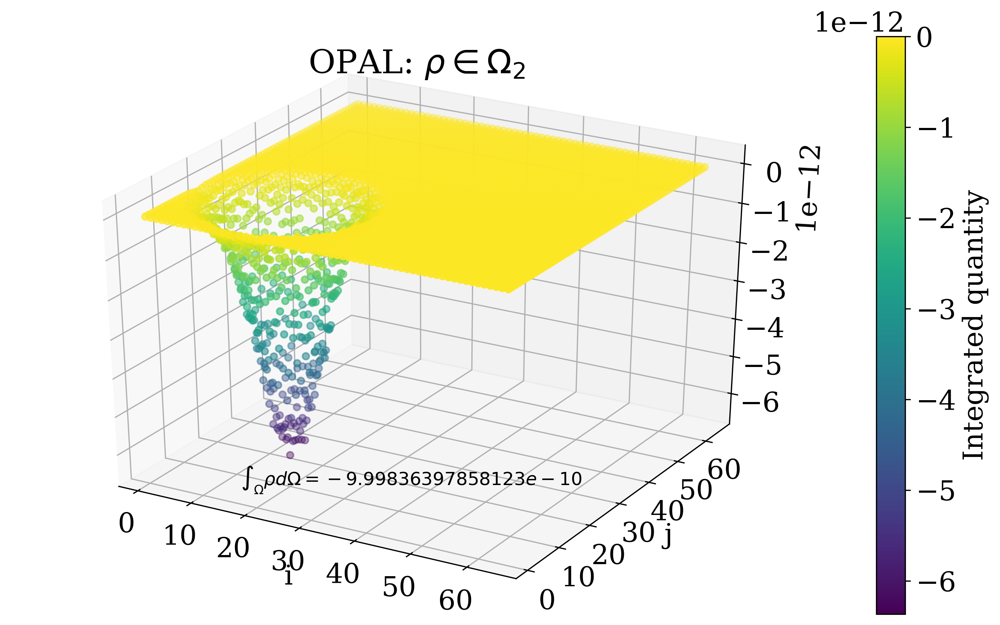

In [20]:
visualize_integrated_scalar_field_3d_disc(opalrhs2, r'OPAL: $\rho \in \Omega_2$ ')

In [21]:
visualize_integrated_scalar_field_3d_disc(opalrhs2tr, r'OPAL: $\hat\rho \in \Omega_2$ (rhs)')

FileNotFoundError: [Errno 2] File /psi/home/adelmann/git/opal-src-4-opalx-debug/input-files/Drift-2/Drift-3-rhs2tr_scalar-000000.dat does not exist: '/psi/home/adelmann/git/opal-src-4-opalx-debug/input-files/Drift-2/Drift-3-rhs2tr_scalar-000000.dat'

2112
2112


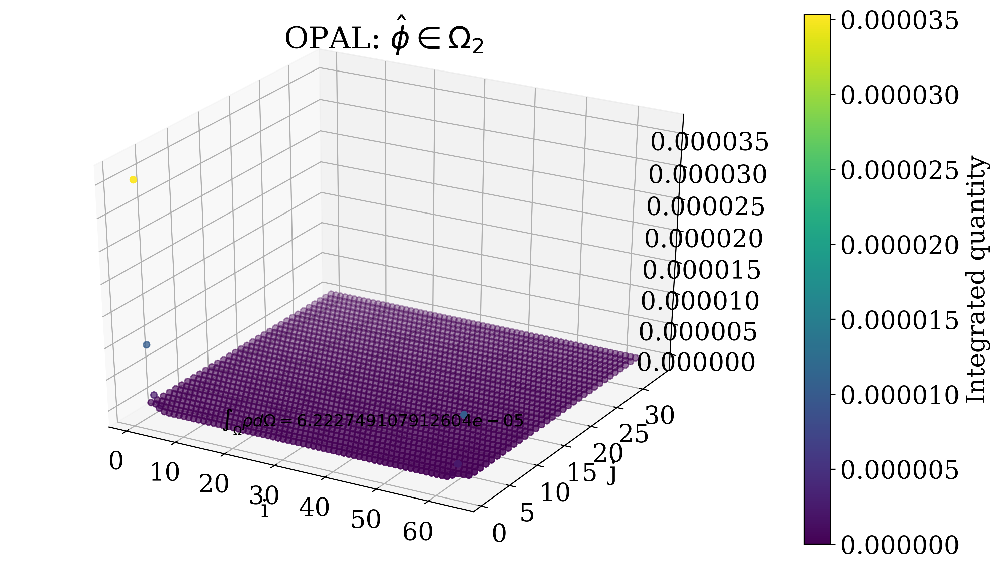

In [12]:
visualize_integrated_scalar_field_3d_disc(opalsol2tr, r'OPAL: $\hat\phi \in \Omega_2$')

2112
2112


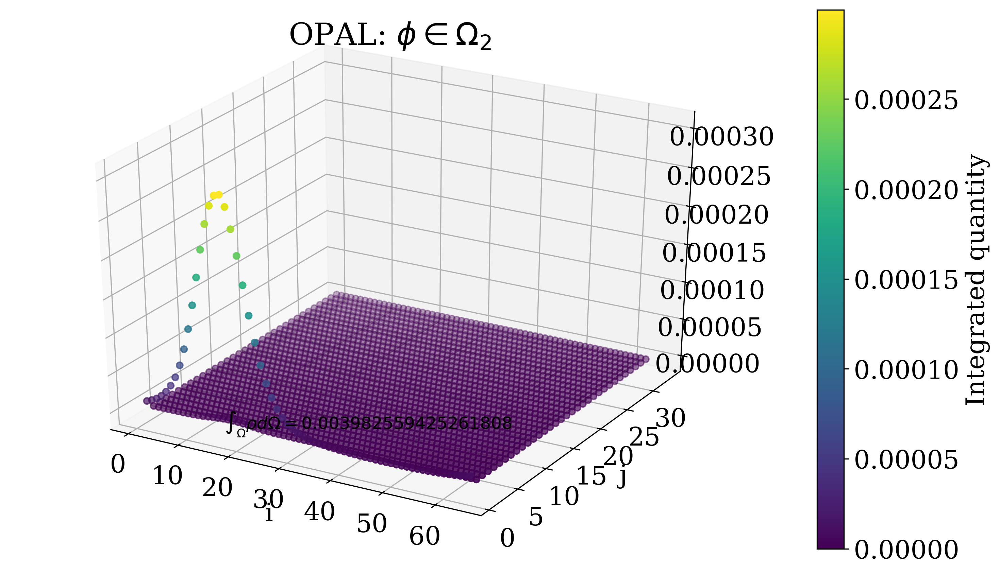

In [13]:
visualize_integrated_scalar_field_3d_disc(opalsol2, r'OPAL: $\phi \in \Omega_2$')

4096
4096


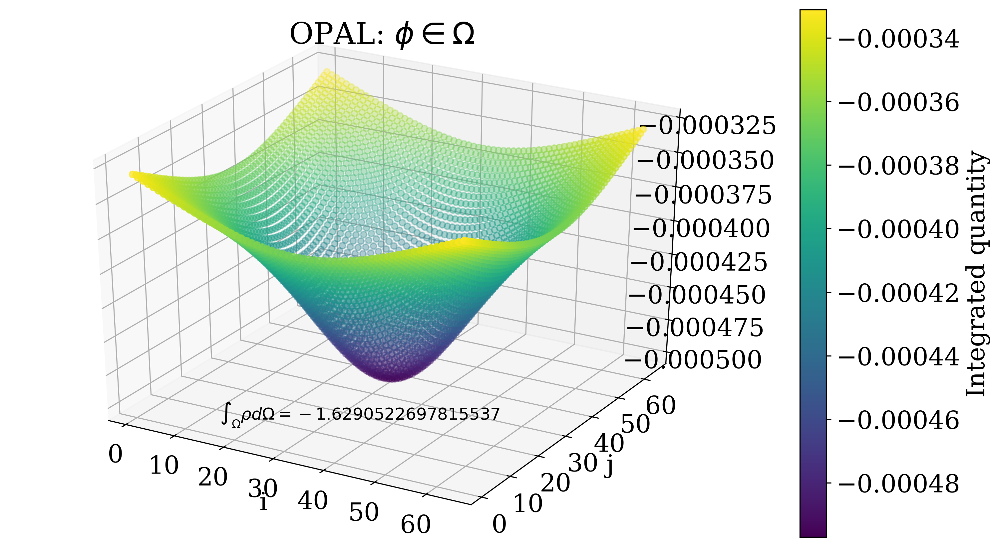

In [28]:
visualize_integrated_scalar_field_3d_disc(opalsol, r'OPAL: $\phi \in \Omega$')

# OPALX fields

In [14]:
opalxrho     = opalxdir + 'Drift-2-rho_scalar-000002.dat'
opalxsol     = opalxdir + 'Drift-2-phi_scalar-000003.dat'

1024
1024


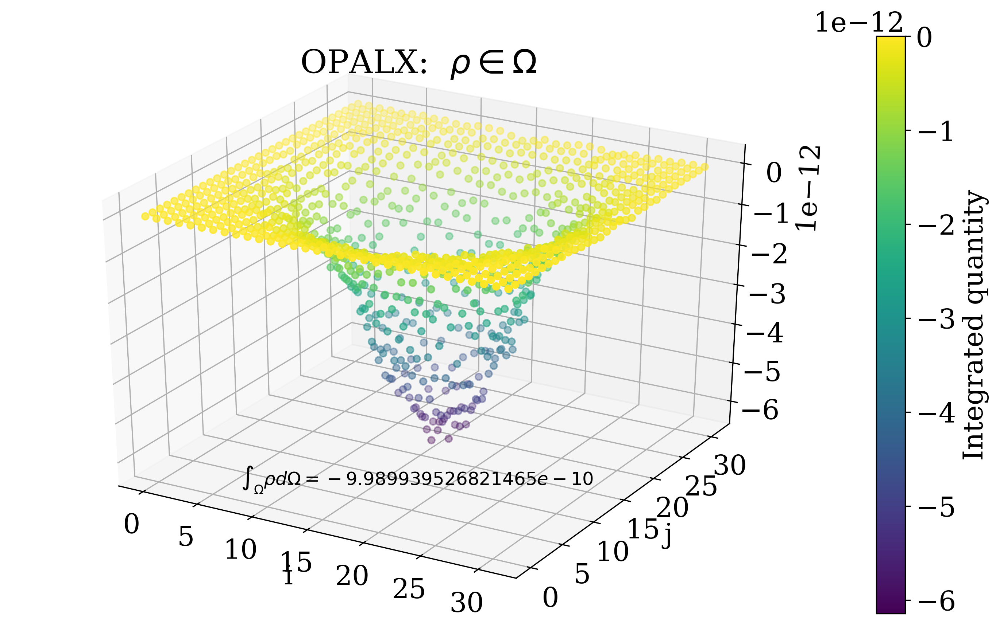

In [15]:
visualize_integrated_scalar_field_3d_disc(opalxrho, r'OPALX:  $\rho \in \Omega$')

1024
1024


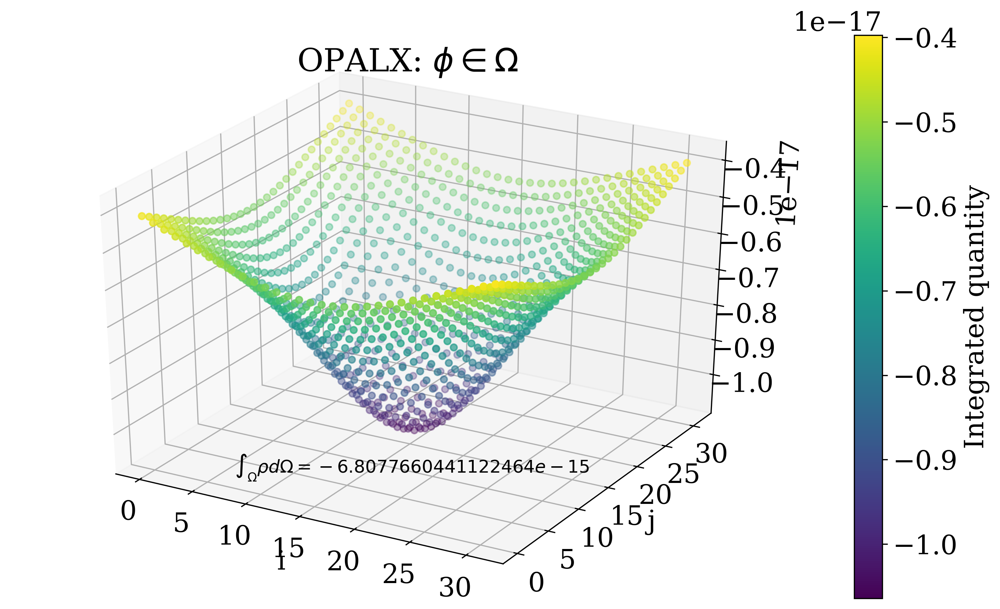

In [16]:
visualize_integrated_scalar_field_3d_disc(opalxsol, r'OPALX: $\phi \in \Omega$')

In [17]:
opalxsol

'/psi/home/adelmann/opalx/input-files/data/Drift-2-phi_scalar-000003.dat'